### **Spatiotemporal Cell-type Redistribution and Inferred Cell-state Dynamics (Embryonic Chicken Heart)**

In [1]:
options(warn = -1)
suppressPackageStartupMessages({
    library(Seurat)
    library(ggplot2)
    library(cowplot)
    library(patchwork)
    library(dplyr)
    library(tidyr)
    library(readxl)
    library(ggpubr)
})

In [2]:
samples <- c("D4", "D7LV", "D7RV", "D10LV", "D10RV", "D14LV", "D14RV")
smpl_info <- list(case = "ChickenEmbryo", TF0  = "D4", TF1  = "D7", TF2  = "D10", TF3  = "D14")

### *Step 1 : Analysis of single-cell data*

###### **Preprocessing, QC, Dimensionality reduction**

In [3]:
samples = c("D4", "D7LV", "D7RV", "D10LV", "D10RV", "D14LV", "D14RV")

mito_genes = c("ND1", "ND2", "COX1", "COII", "ATP8", "ATP6", "COX3", "ND3", "ND4L", "ND4", "ND5", "CYTB", "ND6")

In [4]:
prepare_datasets <- function(sample_name, mito_genes){
    data <- Read10X_h5(paste0('../Data/GSE149457_chickenheart/scRNAseq_', sample_name, '.h5'), use.names = TRUE, unique.features = TRUE)
    seurat.object <- CreateSeuratObject(counts = data, min.cells = 3, min.features = 200, project = sample_name)

    seurat.object$percent_mito <- PercentageFeatureSet(seurat.object, features = mito_genes)
    return(seurat.object)
}

In [5]:
day4 = prepare_datasets(samples[1], mito_genes)
day7_lv = prepare_datasets(samples[2], mito_genes)
day7_rv = prepare_datasets(samples[3], mito_genes)
day10_lv = prepare_datasets(samples[4], mito_genes)
day10_rv = prepare_datasets(samples[5], mito_genes)
day14_lv = prepare_datasets(samples[6], mito_genes)
day14_rv = prepare_datasets(samples[7], mito_genes)

#day4 <- subset(day4, subset = nFeature_RNA <= 3000 & nCount_RNA <= 10500)
#day7_lv <- subset(day7_lv, subset = nFeature_RNA <= 2500 & nCount_RNA <= 7500)
#day7_rv <- subset(day7_rv, subset = nFeature_RNA <= 3000 & nCount_RNA <= 10500)
#day10_lv <- subset(day10_lv, subset = nFeature_RNA <= 1500 & nCount_RNA <= 3750)
#day10_rv <- subset(day10_rv, subset = nFeature_RNA <= 1500 & nCount_RNA <= 3750)
#day14_lv <- subset(day14_lv, subset = nFeature_RNA <= 1000 & nCount_RNA <= 2500)
#day14_rv <- subset(day14_rv, subset = nFeature_RNA <= 1000 & nCount_RNA <= 2500)

merged_srt = merge(day4, y = c(day7_lv, day7_rv, day10_lv, day10_rv, day14_lv, day14_rv), add.cell.ids = samples, project = "ChickenEmbryo")
merged_srt$orig.ident <- factor(x = merged_srt$orig.ident, levels = c(samples[1:7]))

In [6]:
options(repr.plot.height = 5, repr.plot.width = 20)
feats <- c("nFeature_RNA", "nCount_RNA", "percent_mito")

pdf(file = paste0("../Results - Chicken/1_scRNAseq/ChickenEmbryo_QC.pdf"), height = 5, width = 20, useDingbats=FALSE)
VlnPlot(merged_srt, features = feats, group.by = "orig.ident", pt.size = 0.1, ncol = 3) & theme(axis.title.x = element_blank())
plot_grid(FeatureScatter(merged_srt, "nCount_RNA", "nFeature_RNA", group.by = "orig.ident"),
          FeatureScatter(merged_srt, "nCount_RNA", "percent_mito", group.by = "orig.ident") + NoLegend(), ncol = 2)
dev.off()

merged_srt <- subset(merged_srt, subset = nFeature_RNA >= 200 & percent_mito <= 20)

agg_record_1912521242 
                    2

###### **Cell-cycle scoring**

In [7]:
merged_srt[["RNA"]] <- JoinLayers(merged_srt[["RNA"]])
DefaultAssay(merged_srt) <- "RNA"

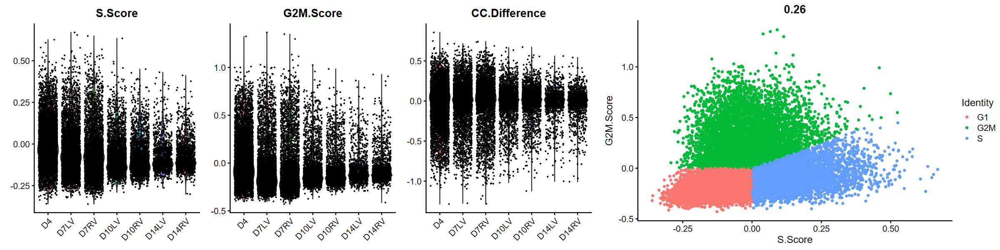

In [8]:
merged_srt <- NormalizeData(merged_srt, verbose = FALSE)
merged_srt <- CellCycleScoring(merged_srt, s.features = cc.genes$s.genes, g2m.features = cc.genes$g2m.genes)
merged_srt$CC.Difference <- merged_srt$S.Score - merged_srt$G2M.Score

options(repr.plot.height = 5, repr.plot.width = 20)
plot_grid(VlnPlot(merged_srt, features = c("S.Score", "G2M.Score", "CC.Difference"), group.by = "orig.ident") & theme(axis.title.x = element_blank()),
          FeatureScatter(merged_srt, "S.Score", "G2M.Score", group.by = "Phase"), rel_widths = c(3, 2))

###### **Doublet prediction**

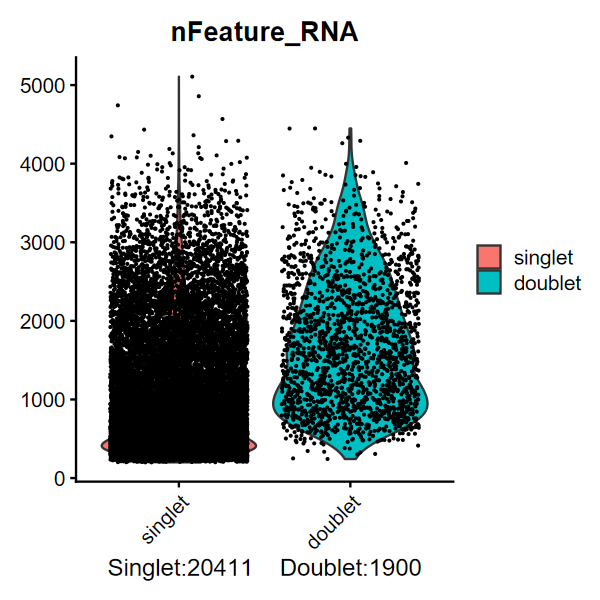

In [9]:
suppressPackageStartupMessages({
    library(scDblFinder)
    library(SingleCellExperiment)
})
sce <- as.SingleCellExperiment(merged_srt)
sce <- suppressMessages(scDblFinder(sce))
merged_srt <- as.Seurat(sce)
merged_srt$ident <- NULL

doublet.count = paste0("Singlet:", length(grep("singlet", merged_srt$scDblFinder.class)), "    ",
                       "Doublet:", length(grep("doublet", merged_srt$scDblFinder.class)))
options(repr.plot.height = 5, repr.plot.width = 5)
VlnPlot(merged_srt, features = "nFeature_RNA", group.by = "scDblFinder.class") & xlab(doublet.count)

In [10]:
merged_srt <- subset(merged_srt, subset = scDblFinder.class  == "singlet")         # Remove doublets

###### **FVF, Scaling, Dimensionality Reduction, ...**

In [11]:
Elbow_vis <- function(object) {
    pct <- object[["pca"]]@stdev / sum(object[["pca"]]@stdev) * 100      # Determine percent of variation associated with each PC
    cumu <- cumsum(pct)                                                  # Calculate cumulative percents for each PC

    # Determine which PC exhibits cumulative percent greater than 90% and % variation associated with the PC as less than 5
    co1 <- which(cumu > 90 & pct < 5)[1]  
    # Determine the difference between variation of PC and subsequent PC, and last point where change of % of variation is more than 0.1%.
    co2 <- sort(which((pct[1:length(pct) - 1] - pct[2:length(pct)]) > 0.1), decreasing = T)[1] + 1

    pcs <- min(co1, co2)                                                 # Minimum of the two calculation

    plot_df <- data.frame(pct = pct, cumu = cumu, rank = 1:length(pct))  # Create a dataframe with values

    # Elbow plot to visualize 
    ggplot(plot_df, aes(cumu, pct, label = rank, color = rank > pcs)) + geom_text() + geom_vline(xintercept = 90, color = "grey") + 
           geom_hline(yintercept = min(pct[pct > 5]), color = "grey") + theme_bw()
}

In [13]:
merged_srt <- FindVariableFeatures(merged_srt, selection.method = "vst", nfeatures = 2000, verbose = FALSE)
p1 <- LabelPoints(plot = VariableFeaturePlot(merged_srt), points = head(VariableFeatures(merged_srt), 20), xnudge = 0, ynudge = 0, repel = TRUE)

merged_srt <- ScaleData(merged_srt, vars.to.regress = c("nFeature_RNA", "percent_mito", "percent_ribo", "percent_hemo", "CC.Difference"), verbose = FALSE)
merged_srt <- RunPCA(merged_srt, features = VariableFeatures(merged_srt), npcs = 50, verbose = FALSE)
p2 <- Elbow_vis(merged_srt)

options(repr.plot.height = 5, repr.plot.width = 20)
pdf(file = paste0("../Results - Chicken/1_scRNAseq/VF & Elbow.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(p1, p2, ncol = 2)
dev.off()

agg_record_1677384275 
                    2

In [13]:
merged_srt <- FindNeighbors(merged_srt, dims = 1:15, verbose = FALSE)
merged_srt <- RunUMAP(merged_srt, dims = 1:15, verbose = FALSE)

In [14]:
saveRDS(merged_srt, file = paste0("../Results - Chicken/1_scRNAseq/ChickenEmbryo_NoCCA.rds"), compress = TRUE)

###### **Clustering**

In [3]:
#rm(list = ls())
srtobj <- readRDS(paste0("../Results - Chicken/1_scRNAseq/ChickenEmbryo_INT_Unfiltered.rds"))
#srtobj <- subset(srtobj, orig.ident == c('D4'))

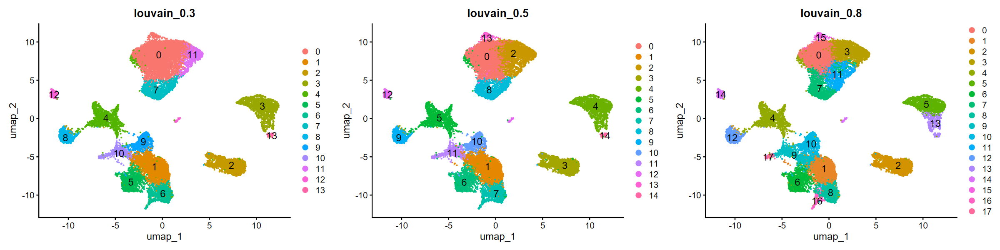

In [4]:
srtobj <- FindClusters(srtobj, resolution = c(0.3 ,0.5, 0.8), verbose = FALSE)

options(repr.plot.height = 5, repr.plot.width = 20)
plot_grid(DimPlot(srtobj, group.by = "CCA_snn_res.0.3", label = TRUE, label.size = 5) + ggtitle("louvain_0.3"), 
          DimPlot(srtobj, group.by = "CCA_snn_res.0.5", label = TRUE, label.size = 5) + ggtitle("louvain_0.5"),
          DimPlot(srtobj, group.by = "CCA_snn_res.0.8", label = TRUE, label.size = 5) + ggtitle("louvain_0.8"), ncol = 3)

In [5]:
Idents(srtobj) <- "CCA_snn_res.0.3"
DefaultAssay(srtobj) <- "RNA"
t(table(Idents(srtobj), srtobj$orig.ident))

       
           0    1    2    3    4    5    6    7    8    9   10   11   12   13
  D4    1461  204  487  671  460  516  226  180   46  247   25   72  123    0
  D7LV  1309  246  535  403  240  165  259  293  101  113   99  200   57   53
  D7RV  1167  120  433  288  139  203  223  284   69   95   42  138   49   29
  D10LV  727  659  160   74  157  131   68  179   84   93  156  106   16    2
  D10RV  387  467  222  104  297   57  235   70   98   97  130   68   10    0
  D14LV  164  398   38   27  120   51   91   31  154   52  102   36   16    2
  D14RV  186  474   55   33  179   92  103   40  217   55  144   36   22    1

###### **DEGs**

In [6]:
DEG_table = FindAllMarkers(srtobj, assay = "RNA", do.print = TRUE, logfc.threshold = 0.5, return.thresh = 0.1, min.pct = 0.5, only.pos = TRUE, verbose = FALSE)
DEG_table <- subset(DEG_table[!(rownames(DEG_table) %in% grep("^ENSGAL", x = rownames(DEG_table), value = TRUE)),])
DEG_table$diff.pct <- DEG_table$pct.1 - DEG_table$pct.2
write.csv(DEG_table, "../Results - Chicken/1_scRNAseq/DEG_table.csv")

top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% dplyr::filter(avg_log2FC > 1) %>% slice_head(n = 25) %>% ungroup())
#top_markers = DEG_table %>% group_by(cluster) %>% top_n(5, avg_log2FC)
#levels(top_markers$cluster) == levels(srtobj$CCA_snn_res.0.5)

In [7]:
feat <- c('POSTN', 'COL3A1', 'DCN', 'TNNC1', 'TNNT2', 'IRX4', 'PITX2', 'NKX2-5', 'TEK', 'NPC2', 'NPR3', 'NFATC1', 'CD34', 'PECAM1', 'CDH5', 'MSX1', 'SOX9', 'TMSB4X', 'TGFB2', 'WT1', 'LUM', 'ALDH1A2', 'HBZ', 'APLN', 'FABP5', 'TM4SF18', 'RGS5', 'MYH11', 'TAGLN', 'ACTA2', 'TBX18', 'TCF21', 'LCP1', 'CSF1R', 'IFI6')
#POSTN, COL3A1, DCN, TNNC1, TNNT2, IRX4, PITX2, NKX2-5, TEK, NPC2, NPR3, NFATC1, CD34, PECAM1, CDH5, MSX1, SOX9, TMSB4X, TGFB2, WT1, LUM, ALDH1A2, HBZ, APLN, FABP5, TM4SF18, RGS5, MYH11, TAGLN, ACTA2, TBX18, TCF21, LCP1, CSF1R, IFI6

pdf 
  2

pdf 
  2

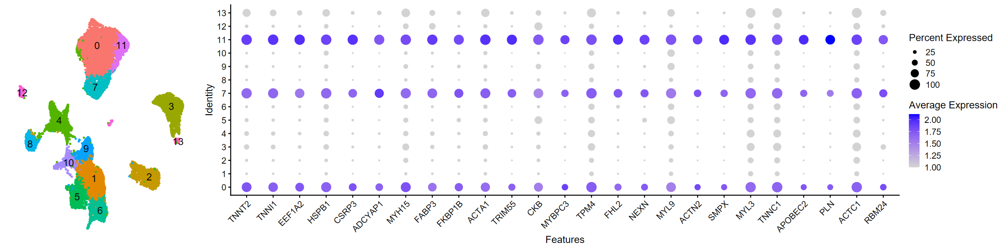

In [8]:
cl = top_markers[which(top_markers$cluster == 0), ]

options(repr.plot.height = 5, repr.plot.width = 20)
plot_grid(DimPlot(srtobj, pt.size = 0.5, label = TRUE, label.size = 5) & NoLegend() & NoAxes(),
          DotPlot(srtobj, features = cl$gene[1:25], dot.min = 0, col.min = 1.0) & RotatedAxis(), rel_widths = c(1, 4))

options(repr.plot.height = 8, repr.plot.width = 20)
png(file = paste0("../Results - Chicken/1_scRNAseq/featureplot.png"), height = 2000, width = 1500)
FeaturePlot(srtobj, features = cl$gene[1:25], label = TRUE, min.cutoff = "q10", ncol = 5)
dev.off()

options(repr.plot.height = 8, repr.plot.width = 20)
png(file = paste0("../Results - Chicken/1_scRNAseq/vlnplot.png"), height = 2000, width = 1500)
VlnPlot(srtobj, features = cl$gene[1:25], pt.size = 0, ncol = 5)
dev.off()

In [9]:
head(top_markers[which(top_markers$cluster == 0), ], 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,diff.pct
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<dbl>
1,0,2.765936,0.926,0.329,0,0,TNNT2,0.597
2,0,2.530692,0.900,0.306,0,0,TNNI1,0.594
3,0,2.653742,0.816,0.243,0,0,EEF1A2,0.573
4,0,2.509504,0.961,0.420,0,0,HSPB1,0.541
5,0,2.640111,0.712,0.191,0,0,CSRP3,0.521
6,0,2.452559,0.692,0.180,0,0,ADCYAP1,0.512
7,0,2.826455,0.954,0.446,0,0,MYH15,0.508
8,0,2.310963,0.802,0.301,0,0,FABP3,0.501
9,0,2.405038,0.759,0.271,0,0,FKBP1B,0.488


###### **Cell-type identification**

In [ ]:
CellMarkerDB <- data.frame(read_xlsx("./Data/PanglaoDB.xlsx"))
CellMarkerDB <- data.frame(subset(CellMarkerDB, 
                                  species == 'Human' & tissue_class == 'Brain' & cancer_type == 'Glioblastoma', 
                                  select = c('species', 'tissue_class', 'tissue_type', 'cancer_type', 'cell_name', 'marker', 'Symbol','Genetype')))
#head(CellMarkerDB, 5)

In [ ]:
feats = cl$gene[1:30]
gene_marker <- CellMarkerDB[which(CellMarkerDB$marker %in% feats | CellMarkerDB$Symbol %in% feats),]
gene_marker
t(as.data.frame(table(gene_marker$cell_name)))

###### **Celltype annotation**

In [10]:
new.cluster.ids = c('0' = "Cardiomyocytes",
                    '1' = "Fibroblast cells",
                    '2' = "Endocardial cells",
                    '3' = "Erythrocytes",
                    '4' = "TMSB4X high cells",
                    '5' = "Valve cells",
                    '6' = "Epi-epithelial cells",
                    '7' = "Endocardial cells",
                    '8' = "Vascular endothelial cells",
                    '9' = "Epi-mesenchymal cells",
                    '10'= "Mural cells",
                    '11'= "Immature myocardial cells",                  
                    '12'= "Macrophages",                  
                    '13'= "Erythrocytes")                 
names(new.cluster.ids) = levels(srtobj)
srtobj = RenameIdents(srtobj, new.cluster.ids)
srtobj$cell_types <- as.character(srtobj@active.ident)

saveRDS(srtobj, file = paste0("../Results - Chicken/1_scRNAseq/chicken_Final.rds"), compress = TRUE)

pdf(file = paste0("../Results - Chicken/1_scRNAseq/chicken_Final.pdf"), width = 10, height = 10, onefile = TRUE)
DimPlot(srtobj, label = TRUE, label.size = 4, repel = TRUE)
dev.off()

pdf 
  2

In [11]:
library(RColorBrewer)

pt <- as.data.frame(table(Idents(srtobj), srtobj$orig.ident))
pt$Var1 <- as.character(pt$Var1)
pt$Var2 <- factor(x = pt$Var2, levels = c(samples[1:7]))
pt <- pt %>% group_by(Var2) %>% mutate(percent = round(Freq / sum(Freq), 2))

options(repr.plot.height = 5, repr.plot.width = 20)
pdf(file = paste0("../Results - Chicken/1_scRNAseq/chicken_celltypePercent.pdf"), width = 20, height = 5, onefile = TRUE)
ggplot(pt, aes(x = Var2, y = Freq, fill = Var1)) + coord_flip() + theme_bw(base_size = 15) + geom_col(position = "fill", width = 0.5) +
           geom_text(aes(label = scales::percent(percent)), size = 4, position = position_fill(vjust = 0.5), angle = 90) +
           xlab("Time frames") + ylab("Proportion") + scale_fill_manual(values = brewer.pal(12, "Paired")) + theme(legend.title = element_blank())
dev.off()

pdf 
  2

### *Step 2 : Analysis of spatial data*

###### **Preprocessing, QC**

In [3]:
spatial_data = Load10X_Spatial("../Data/GSE149457_chickenheart/D14/",
                               "chicken_heart_spatial_RNAseq_D14.h5", assay = "Spatial", slice = "image", filter.matrix = TRUE)
spatial_data@meta.data$barcode <- row.names(spatial_data@meta.data)
spatial_data@meta.data <- spatial_data@meta.data[, c("orig.ident", "barcode", "nCount_Spatial", "nFeature_Spatial")]

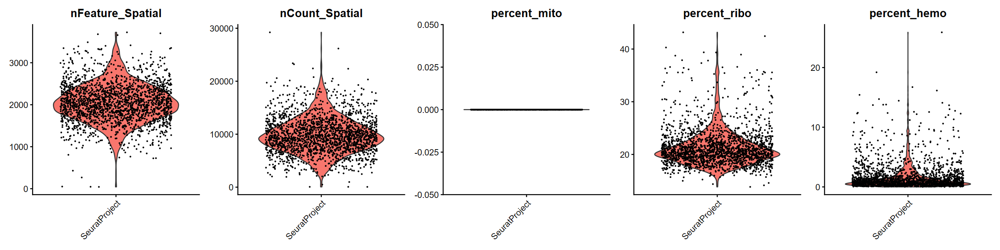

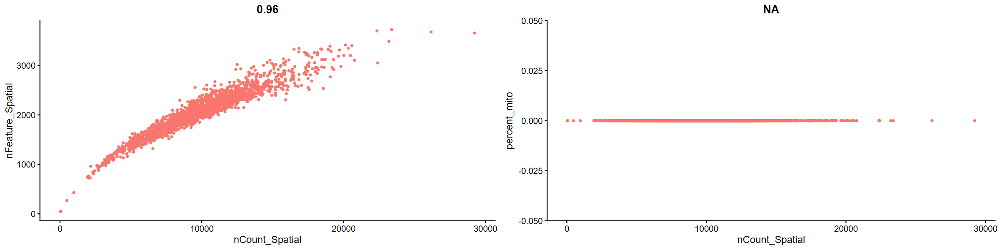

In [4]:
spatial_data[['percent_mito']] <- PercentageFeatureSet(spatial_data, pattern = '^MT-')
spatial_data[['percent_ribo']] <- PercentageFeatureSet(spatial_data, pattern = '^RP[SL]')
spatial_data[['percent_hemo']] <- PercentageFeatureSet(spatial_data, pattern = '^HB[^(P)]')

options(repr.plot.height = 5, repr.plot.width = 20)
feats <- c("nFeature_Spatial", "nCount_Spatial", "percent_mito", "percent_ribo", "percent_hemo")

VlnPlot(spatial_data, features = feats, group.by = "orig.ident", pt.size = 0.1, ncol = 5) & theme(axis.title.x = element_blank())
plot_grid(FeatureScatter(spatial_data, "nCount_Spatial", "nFeature_Spatial", group.by = "orig.ident") + NoLegend(),
          FeatureScatter(spatial_data, "nCount_Spatial", "percent_mito", group.by = "orig.ident") + NoLegend(), ncol = 2)

spatial_data <- spatial_data[!grepl("MALAT1", rownames(spatial_data)), ]        # Filter MALAT1
spatial_data <- spatial_data[!grepl("^MT-", rownames(spatial_data)), ]          # Filter Mitocondrial genes
spatial_data <- spatial_data[!grepl("^RP[SL]", rownames(spatial_data)), ]       # Filter Ribossomal genes
spatial_data <- spatial_data[!grepl("^HB[^(P)]", rownames(spatial_data)), ]     # Filter Hemoglobin genes
#spatial_data <- subset(spatial_data, subset = nFeature_Spatial < 8000 & nFeature_Spatial > 500 & nCount_Spatial < 35000 & percent_mito < 15 & percent_ribo < 20 & percent_hemo < 0.3)

###### **Dimensionality reduction, Clustering**

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


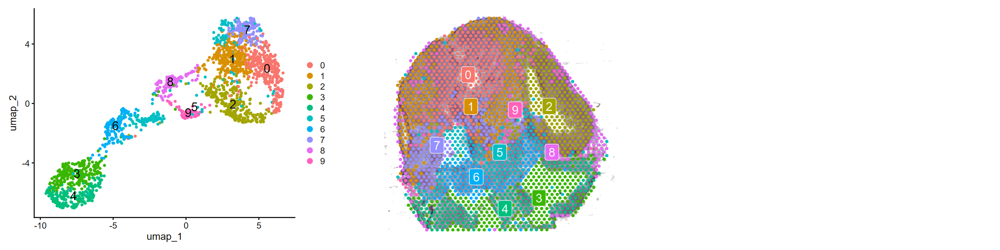

In [5]:
spatial_data <- spatial_data %>% SCTransform(assay = "Spatial", vst.flavor = "v1", verbose = FALSE) %>%
                                 RunPCA(assay = "SCT", verbose = FALSE) %>% 
                                 FindNeighbors(dims = 1:30, verbose = FALSE) %>%
                                 FindClusters(resolution = 0.8, verbose = FALSE) %>%
                                 RunUMAP(dims = 1:30, verbose = FALSE)

plot_grid(DimPlot(spatial_data, reduction = "umap", label = TRUE, label.size = 6, pt.size = 1),
          SpatialDimPlot(spatial_data, label = TRUE, label.size = 6, pt.size = 2) + NoLegend(), ncol = 3)
#SpatialDimPlot(stData, cells.highlight = CellsByIdentities(stData, idents = c(2, 1, 4, 3, 5, 8)), facet.highlight = TRUE, ncol = 6)

###### **Identification of Spatially Variable Features (SVF)**

In [6]:
SpatiallyVariableFeatures_workaround <- function(object, assay="SCT", selection.method = "moransi") {
    #' This is work around function to replace SeuratObject::SpatiallyVariableFeatures function.
    #' return ranked list of Spatially Variable Features
    
    # Check if object is a Seurat object
    if (!inherits(object, "Seurat")) {
        stop("object must be a Seurat object")
    }
    
    # Check if assay is a valid assay
    if (!assay %in% names(object@assays)) {
        stop("assay must be a valid assay")
    }
    
    # Extract meta.features from the specified object and assay
    data <- object@assays[[assay]]@meta.features
    
    # Select columns starting with the provided col_prefix
    moransi_cols <- grep(paste0("^", selection.method), colnames(data), value = TRUE)
    
    # Filter rows where "moransi.spatially.variable" is TRUE
    filtered_data <- data[data[[paste0(selection.method, ".spatially.variable")]], moransi_cols]
    
    # Sort filtered data by "moransi.spatially.variable.rank" column in ascending order
    sorted_data <- filtered_data[order(filtered_data[[paste0(selection.method, ".spatially.variable.rank")]]), ]
    
    # Return row names of the sorted data frame
    rownames(sorted_data)
}

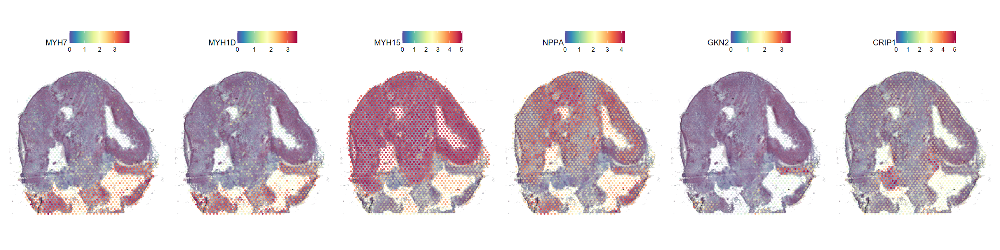

In [7]:
spatial_data <- FindSpatiallyVariableFeatures(spatial_data, assay = 'SCT', 
                                              features = VariableFeatures(spatial_data)[1:25], selection.method = 'moransi', verbose = FALSE)
top.features <- head(SpatiallyVariableFeatures_workaround(spatial_data, selection.method = 'moransi'), 6)
SpatialPlot(spatial_data, features = top.features, ncol = 6, alpha = c(0.1, 1))

In [8]:
saveRDS(spatial_data, file = paste0("../Results - Chicken/2_stRNAseq/D14_SVF.rds"), compress = TRUE)

###### **DEGs**

In [ ]:
DEG_table <- FindAllMarkers(spatial_data, logfc.threshold = 0.1, only.pos = TRUE, verbose = FALSE)
DEG_table$diff.pct <- DEG_table$pct.1 - DEG_table$pct.2

In [ ]:
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(-25, p_val_adj))
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(25, diff.pct) %>% top_n(50, avg_log2FC) %>% top_n(-100, p_val_adj))
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(-25, p_val_adj) %>% filter(avg_log2FC > 1))
top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% dplyr::filter(avg_log2FC > 1) %>% slice_head(n = 25) %>% ungroup())

In [ ]:
cl = top_markers[which(top_markers$cluster == 15), ]
feat <- c('LPL', 'TNC', 'PON2', 'PLAT', 'SLC1A3')

options(repr.plot.height = 4, repr.plot.width = 20)
plot_grid(DimPlot(spatial_data, pt.size = 0.5, label = TRUE, label.size = 5) & NoLegend() & NoAxes(),
          DotPlot(spatial_data, features = cl$gene, dot.min = 0, col.min = 0) & RotatedAxis(), rel_widths = c(1, 4))

options(repr.plot.height = 7, repr.plot.width = 20)
VlnPlot(spatial_data, features = cl$gene[1:10], pt.size = 0, ncol = 5)
FeaturePlot(spatial_data, features = cl$gene[1:10], label = TRUE, min.cutoff = "q10", ncol = 5)
#VlnPlot(spatial_data, features = feat, pt.size = 0, ncol = 5)
#FeaturePlot(spatial_data, features = feat, label = TRUE, min.cutoff = "q10", ncol = 5)

In [ ]:
head(top_markers[which(top_markers$cluster == 15), ], 10)

In [ ]:
new.cluster.ids = c('0' = "Neurons",
                    '1' = "Endothelial cells", 
                    '2' = "Microglial cells", 
                    '3' = "Epithelial cells",
                    '4' = "Oligodendrocytes", 
                    '5' = "Astrocytes", 
                    '6' = "Neurons", 
                    '7' = "Neurons",
                    '8' = "Epithelial cells",
                    '9' = "Oligodendrocyte precursor cells",
                    '10'= "Fibroblasts")
names(new.cluster.ids) = levels(spatial_data)
spatial_data = RenameIdents(spatial_data, new.cluster.ids)
spatial_data$cell_types <- as.character(spatial_data@active.ident)

saveRDS(spatial_data, file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_SVF.rds"), compress = TRUE)

pdf(file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_SVF.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(DimPlot(spatial_data, reduction = "umap", repel = TRUE, label = TRUE, label.size = 5),
          SpatialDimPlot(spatial_data, repel = TRUE, label = TRUE, label.size = 5))
dev.off()

### *Step 3 : Cell-type deconvolution using CARD*

###### **Loading of scRNA-seq and stRNA-seq data, Cell-type Deconvolution(CARD)**

In [3]:
suppressPackageStartupMessages({
    library(CARD)
    library(SingleCellExperiment)
})

In [4]:
ref_list <- list("D4"  = "D4",
                 "D7"  = c("D7LV", "D7RV"),
                 "D10" = c("D10LV", "D10RV"),
                 "D14" = c("D14LV", "D14RV"))

reference_full <- readRDS("./1_scRNAseq/chicken_Annotated.rds")
query <- readRDS("./2_stRNAseq/D14_SVF.rds")
#query <- UpdateSeuratObject(query)   # uncomment if needed
all_summaries <- list()

pdf(file = paste0("./3_deconvolution/", smpl_info$case, "_AllPlots.pdf"), height = 5, width = 20, useDingbats = FALSE)

for (ref_name in names(ref_list)) {
    ref_idents <- ref_list[[ref_name]]
    reference  <- reference_full[, reference_full$orig.ident %in% ref_idents]
    
    print(plot_grid(DimPlot(reference, label = TRUE, label.size = 3.5) & xlab("Single-cell dataset"),
          DimPlot(query, label = TRUE, label.size = 5, repel = TRUE) & xlab("Spatial dataset"),
          SpatialDimPlot(query, label = TRUE, label.size = 5, pt.size.factor = 2.5, repel = TRUE), ncol = 3))
    
    # ---- Prepare input for CARD ----
    spatial_count    <- query[["Spatial"]]$counts
    spatial_location <- GetTissueCoordinates(query)
    colnames(spatial_count) <- gsub(" ", "x", paste(spatial_location$x, spatial_location$y))
    rownames(spatial_location) <- gsub(" ", "x", paste(spatial_location$x, spatial_location$y))
    spatial_location$cell <- NULL

    sc_count <- reference[["RNA"]]$counts
    sc_meta  <- reference@meta.data[, c("orig.ident", "cell_types")]
    sc_meta$cellID <- rownames(sc_meta)
    sc_meta <- sc_meta[, c("cellID", "orig.ident", "cell_types")]
    colnames(sc_meta) <- c("cellID", "sampleInfo", "cellType")

    ###### Cell Type Deconvolution
    invisible(capture.output({
        CARD_obj <- createCARDObject(sc_count, sc_meta, spatial_count, spatial_location, ct.varname = "cellType",
                                     ct.select = unique(sc_meta$cellType), sample.varname = "sampleInfo", minCountGene = 100, minCountSpot = 5)
        CARD_obj = suppressMessages(CARD_deconvolution(CARD_obj))
    }))

    ## visualize the spatial distribution of the cell type proportion at a standard resolution
    p1 <- CARD.visualize.prop(CARD_obj@Proportion_CARD, CARD_obj@spatial_location, sort(colnames(CARD_obj@Proportion_CARD)), NumCols = 6, pointSize = 0.5)
    invisible(capture.output({CARD_obj <- CARD.imputation(CARD_obj, NumGrids = 4000, ineibor = 10, exclude = NULL)}))
    location_imputation = cbind.data.frame(x=as.numeric(sapply(strsplit(rownames(CARD_obj@refined_prop), split="x"),"[",1)),
                                           y=as.numeric(sapply(strsplit(rownames(CARD_obj@refined_prop), split="x"),"[",2)))
    rownames(location_imputation) = rownames(CARD_obj@refined_prop)
    p2 <- CARD.visualize.prop(CARD_obj@refined_prop, location_imputation, sort(colnames(CARD_obj@refined_prop)), NumCols = 6, pointSize = 0.5)
    print(plot_grid(p1, p2, labels = c('Unrefined', 'Refined'), nrow = 2))
    CARD.visualize.Cor(CARD_obj@Proportion_CARD, colors = NULL) 

    # ---- Summary statistics ----
    n_spots      <- nrow(CARD_obj@spatial_location)
    n_ref_cells  <- nrow(sc_meta)
    prop_mat     <- CARD_obj@Proportion_CARD
    celltype_abundance <- colSums(prop_mat)
    df <- data.frame(Sample = ref_name, Reference = paste(ref_idents, collapse = "+"), n_spatial_spots = n_spots, 
                     n_reference_cells = n_ref_cells, t(celltype_abundance), stringsAsFactors  = FALSE, check.names = FALSE)
    all_summaries[[ref_name]] <- df

    PropCARD <- cbind(CARD_obj@spatial_location, CARD_obj@Proportion_CARD)
    write.csv(PropCARD, file = paste0("./4_modelling/ChickenEmbryo_", ref_name, "_PropCARD.csv"), row.names = FALSE)

    saveRDS(CARD_obj, file = paste0("./3_deconvolution/ChickenEmbryo_", ref_name, ".rds"), compress = TRUE)
}
dev.off()
final_summary <- bind_rows(all_summaries)
write.csv(final_summary, file = paste0("./3_deconvolution/AllSamples_CARDsummary.csv"), row.names = FALSE)
message("Processing of all ", smpl_info$case, " samples has been completed!!!")

agg_record_31ac287960cd 
                      2

Processing of all ChickenEmbryo samples has been completed!!!



In [5]:
timepoints <- c(smpl_info$TF0, smpl_info$TF1, smpl_info$TF2, smpl_info$TF3)
CARDobj      <- list()
scMapping    <- list()
MapCellCords <- list()
count_SC     <- list()

for (i in seq_along(timepoints)) {
    CARDobj[[i]] <- readRDS(paste0("./3_deconvolution/", timepoints[i], ".rds"))
    scMapping[[i]] <- CARD_SCMapping(CARDobj[[i]], shapeSpot = "Circle", numCell   = 20, ncore = 1)

    MapCellCords[[i]] <- as.data.frame(colData(scMapping[[i]]))
    count_SC[[i]] <- assays(scMapping[[i]])$counts
}

CellLoc <- data.frame(x = MapCellCords[[1]]$x, y = MapCellCords[[1]]$y,
                      centerSPOT = MapCellCords[[1]]$centerSPOT, centerx = MapCellCords[[1]]$centerx, centery = MapCellCords[[1]]$centery)
for(i in seq_along(timepoints)){
    CellLoc[[paste0("TF", i-1)]] <- i-1
    CellLoc[[paste0("TF", i-1, "_ct")]] <- MapCellCords[[i]]$CT
}
write.csv(CellLoc, file = paste0("./4_modelling/", smpl_info$case, "_CellLoc.csv"), row.names = FALSE, col.names=TRUE)
message("Processing of ", smpl_info$case, " data has been completed!!!")

Processing of ChickenEmbryo data has been completed!!!



### *Step 4 : Modeling of Spatiotemporal Cell-type Redistribution and Inferred Cell-state Dynamics*

In [3]:
load_patient <- function(sample_name, path) {
    PropCARDs <- list.files(path)
    
    cellloc_file <- PropCARDs[grepl(paste0("^", sample_name, "_CellLoc\\.csv$"), PropCARDs)]    
    CellLoc <- read.csv(file.path(path, cellloc_file))
    
    sample_files <- PropCARDs[grepl(paste0("^", sample_name, "_.*_PropCARD\\.csv$"), PropCARDs)]    
    
    timepoint_names <- sub(paste0("^", sample_name, "_(.*)_PropCARD\\.csv$"), "\\1", sample_files)    
    desired_order <- c("D4", "D7", "D10", "D14")
    ord <- match(desired_order, timepoint_names)
    ord <- ord[!is.na(ord)]
    
    sample_files   <- sample_files[ord]
    timepoint_names <- timepoint_names[ord]
    
    PropCARD <- lapply(sample_files, function(f) read.csv(file.path(path, f)))
    names(PropCARD) <- timepoint_names
    TFs <- PropCARD
    names(TFs) <- paste0("TF", seq_along(TFs)-1)

    celltypes <- sort(unique(unlist(lapply(TFs, function(df) {setdiff(names(df), c("x","y"))}))))
    final_cols <- c("x","y",celltypes)

    TFs <- lapply(TFs, function(df){
        missing_cols <- setdiff(final_cols, names(df))
        if(length(missing_cols) > 0){
            for(cl in missing_cols)
                df[[cl]] <- 0
        }
        df[, final_cols, drop = FALSE]
    })

    return(list(sample_name = sample_name, CellLoc = CellLoc, timepoint_names = timepoint_names, 
                celltypes = celltypes, timepoints = TFs, PropCARD = PropCARD))
}

In [4]:
sample <- load_patient(sample_name = "ChickenEmbryo", path = "./4_modelling/")
CellLoc <- sample$CellLoc
timepoints <- sample$timepoints

##### **Spatiotemporal Cell-type Redistribution and Inferred Cell-State Dynamics visualization**

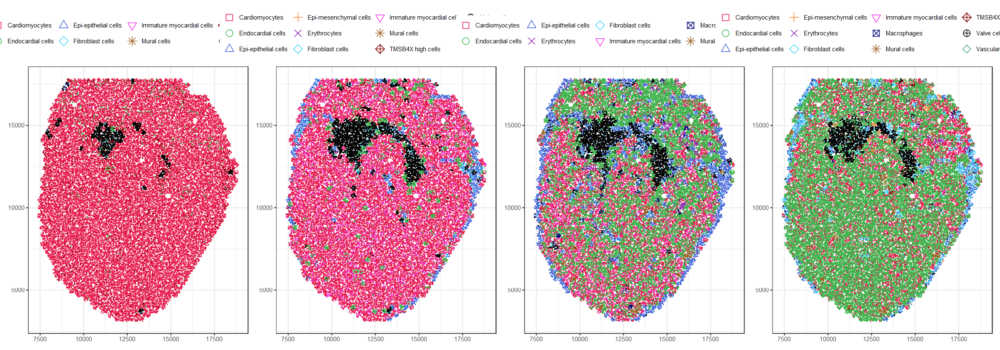

In [5]:
#CellLoc <- read.csv(paste0('./4_modelling/ChickenEmbryo_CellLoc.csv'))

#CellLoc$matching <- (CellLoc$TF0_ct != CellLoc$TF1_ct) & (CellLoc$TF1_ct != CellLoc$TF2_ct) & (CellLoc$TF2_ct != CellLoc$TF0_ct)
#CellLoc <- CellLoc[which(CellLoc$matching == TRUE), ]

t0 <- strsplit(sort(unique(CellLoc$TF0_ct), decreasing = FALSE), split = "[.]")
t1 <- strsplit(sort(unique(CellLoc$TF1_ct), decreasing = FALSE), split = "[.]")
t2 <- strsplit(sort(unique(CellLoc$TF2_ct), decreasing = FALSE), split = "[.]")
t3 <- strsplit(sort(unique(CellLoc$TF3_ct), decreasing = FALSE), split = "[.]")
idx <- which.max(lengths(list(t0, t1, t2, t3)))
colors <- c('#e6194B', '#3cb44b', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6', '#000075', '#9A6324', '#800000', '#000000', '#469990')
shapes <- c('square open', 'circle open', 'triangle open', 'plus', 'cross', 'diamond open', 'triangle down open', 'square cross', 'asterisk', 'diamond plus', 'circle plus', 'diamond filled')
pointColors <- setNames(colors, list(t0, t1, t2, t3)[[idx]])
pointShapes <- setNames(shapes, list(t0, t1, t2, t3)[[idx]])

p1 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF0_ct, color=TF0_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
p2 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF1_ct, color=TF1_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
p3 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF2_ct, color=TF2_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
p4 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF3_ct, color=TF3_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

options(repr.plot.height = 7, repr.plot.width = 20)
p1 + p2 + p3 + p4 + plot_layout(ncol = 4)

In [6]:
ctTF0 <- c(sort(unique(CellLoc$TF0_ct), decreasing = FALSE))
ctTF1 <- c(sort(unique(CellLoc$TF1_ct), decreasing = FALSE))
ctTF2 <- c(sort(unique(CellLoc$TF2_ct), decreasing = FALSE))
ctTF3 <- c(sort(unique(CellLoc$TF3_ct), decreasing = FALSE))

length(ctTF0) <- length(ctTF1) <- length(ctTF2) <- length(ctTF3) <- max(length(ctTF0), length(ctTF1), length(ctTF2), length(ctTF3))                      
ctList <- as.data.frame(cbind(ctTF0, ctTF1, ctTF2, ctTF3))
colnames(ctList) <- c('Celltypes of TF0', 'Celltypes of TF1', 'Celltypes of TF2', 'Celltypes of TF3')
ctList[is.na(ctList)] <- ""
ctList

Celltypes of TF0,Celltypes of TF1,Celltypes of TF2,Celltypes of TF3
<chr>,<chr>,<chr>,<chr>
Cardiomyocytes,Cardiomyocytes,Cardiomyocytes,Cardiomyocytes
Endocardial cells,Endocardial cells,Endocardial cells,Endocardial cells
Epi-epithelial cells,Epi-epithelial cells,Epi-epithelial cells,Epi-epithelial cells
Fibroblast cells,Epi-mesenchymal cells,Erythrocytes,Epi-mesenchymal cells
Immature myocardial cells,Erythrocytes,Fibroblast cells,Erythrocytes
Mural cells,Fibroblast cells,Immature myocardial cells,Fibroblast cells
TMSB4X high cells,Immature myocardial cells,Macrophages,Immature myocardial cells
Valve cells,Mural cells,Mural cells,Macrophages
,TMSB4X high cells,TMSB4X high cells,Mural cells


###### *Spatiotemporal Cell-Type Redistribution*

In [7]:
DF0 <- filter(CellLoc, TF0_ct %in% c('Valve cells'))
DF1 <- filter(CellLoc, TF1_ct %in% c('Valve cells'))
DF2 <- filter(CellLoc, TF2_ct %in% c('Valve cells'))
DF3 <- filter(CellLoc, TF3_ct %in% c('Valve cells'))
if (nrow(DF0) != 0 & nrow(DF1) != 0 & nrow(DF2) != 0 & nrow(DF3) != 0){
    p1 <- ggplot(DF0, aes(x, y, shape=TF0_ct, color=TF0_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF0))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p2 <- ggplot(DF1, aes(x, y, shape=TF1_ct, color=TF1_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF1))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p3 <- ggplot(DF2, aes(x, y, shape=TF2_ct, color=TF2_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF2))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p4 <- ggplot(DF3, aes(x, y, shape=TF3_ct, color=TF3_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF3))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

    tmp0 = select(DF0, c(x, y, centerSPOT, centerx, centery, TF0, TF0_ct))
    tmp1 = select(DF1, c(x, y, centerSPOT, centerx, centery, TF1, TF1_ct))
    tmp2 = select(DF2, c(x, y, centerSPOT, centerx, centery, TF2, TF2_ct))
    tmp3 = select(DF3, c(x, y, centerSPOT, centerx, centery, TF3, TF3_ct))
    colnames(tmp3)=colnames(tmp2)=colnames(tmp1)=colnames(tmp0)
    CellMig = rbind(tmp0, tmp1, tmp2, tmp2)
    row.names(CellMig) <- seq.int(nrow(CellMig))
    colnames(CellMig) <- c('x', 'y', 'centerSPOT', 'centerx', 'centery', 'TF', 'TF_ct')
    ps <- ggplot() + geom_point(CellMig, mapping = aes(x, y, shape=TF_ct, color=TF_ct), size=1) + theme_bw() + labs(caption = paste0('All time frames of ', DF0$TF0_ct[[1]])) + theme(plot.caption = element_text(size = 12), legend.position="none", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
}
options(repr.plot.height = 7, repr.plot.width = 20)
pdf(file = paste0("./Final_outputs/", smpl_info$case, "_Redist.pdf"), height = 6, width = 20, useDingbats=FALSE)
p1 + p2 + p3 + p4 + ps + plot_layout(ncol = 5)
dev.off()

suppressPackageStartupMessages({
    library(gganimate)
    theme_set(theme_bw())
})
animp <- ps + transition_time(CellMig$TF) + ease_aes('linear') + labs(title = "Time frame: {frame_time}") + shadow_wake(wake_length = 1) 
animate(animp, nframes = max(CellMig$TF) - min(CellMig$TF) + 1, fps = 1, duration = 3, 
        renderer = gifski_renderer(paste0('./Final_outputs/', smpl_info$patient, '.gif')))

agg_record_4558143b3d6f 
                      2


Rendering [=============>-----------------------------] at 0.18 fps ~ eta: 11s

Rendering [============================>--------------] at 0.11 fps ~ eta:  9s

Rendering [==========================================] at 0.099 fps ~ eta:  0s
                                                                              



###### *Inferred Cell-State Dynamics*

In [9]:
transitions_freq <- CellLoc %>%
    filter(TF0_ct != TF1_ct | TF1_ct != TF2_ct | TF2_ct != TF3_ct) %>%
    group_by(TF0_ct, TF1_ct, TF2_ct, TF3_ct) %>%
    summarise(count = n(), .groups = 'drop') %>%
    arrange(desc(count))

print(transitions_freq)

if(nrow(transitions_freq) > 0) {
    cat("=", rep("=", 60), "\n", sep="")
    for(i in 1:min(20, nrow(transitions_freq))) {
        cat(sprintf("%2d. %s → %s → %s (Number: %s)\n", i,
                    transitions_freq$TF0_ct[i], 
                    transitions_freq$TF1_ct[i], 
                    transitions_freq$TF2_ct[i],
                    transitions_freq$count[i]))
    }
}

# A tibble: 738 × 5
   TF0_ct         TF1_ct                    TF2_ct                  TF3_ct count
   <chr>          <chr>                     <chr>                   <chr>  <int>
 1 Cardiomyocytes Cardiomyocytes            Cardiomyocytes          Endoc…  6381
 2 Cardiomyocytes Cardiomyocytes            Endocardial cells       Endoc…  6366
 3 Cardiomyocytes Cardiomyocytes            Endocardial cells       Cardi…  3017
 4 Cardiomyocytes Immature myocardial cells Cardiomyocytes          Endoc…  1670
 5 Cardiomyocytes Immature myocardial cells Endocardial cells       Endoc…  1520
 6 Cardiomyocytes Cardiomyocytes            Immature myocardial ce… Endoc…  1322
 7 Cardiomyocytes Cardiomyocytes            Epi-epithelial cells    Endoc…  1068
 8 Cardiomyocytes Immature myocardial cells Cardiomyocytes          Cardi…   819
 9 Cardiomyocytes Immature myocardial cells Endocardial cells       Cardi…   749
10 Cardiomyocytes Cardiomyocytes            Epi-epithelial cells    Cardi…   572
# ℹ 728 

In [13]:
DF <- filter(CellLoc, TF0_ct %in% c('TMSB4X high cells') & TF1_ct %in% c('Immature myocardial cells') & TF2_ct %in% c('Cardiomyocytes') & TF3_ct %in% c('Endocardial cells'))
if (nrow(DF) != 0){
    p1 <- ggplot(DF, aes(x, y, shape=TF0_ct, color=TF0_ct)) + geom_point(size=1) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p2 <- ggplot(DF, aes(x, y, shape=TF1_ct, color=TF1_ct)) + geom_point(size=1) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p3 <- ggplot(DF, aes(x, y, shape=TF2_ct, color=TF2_ct)) + geom_point(size=1) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p4 <- ggplot(DF, aes(x, y, shape=TF3_ct, color=TF3_ct)) + geom_point(size=1) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

    tmp0 = select(DF, c(x, y, centerSPOT, centerx, centery, TF0, TF0_ct))
    tmp1 = select(DF, c(x, y, centerSPOT, centerx, centery, TF1, TF1_ct))
    tmp2 = select(DF, c(x, y, centerSPOT, centerx, centery, TF2, TF2_ct))
    tmp3 = select(DF, c(x, y, centerSPOT, centerx, centery, TF3, TF3_ct))
    colnames(tmp3)=colnames(tmp2)=colnames(tmp1)=colnames(tmp0)
    CellMig = rbind(tmp0, tmp1, tmp2, tmp3)
    row.names(CellMig) <- seq.int(nrow(CellMig))
    colnames(CellMig) <- c('x', 'y', 'centerSPOT', 'centerx', 'centery', 'TF', 'TF_ct')
    pd <- ggplot() + geom_point(CellMig, mapping = aes(x, y, shape=TF_ct, color=TF_ct), size=1) + theme_bw() + labs(caption = paste0("Number of cells in all time frames: ", nrow(DF))) + theme(plot.caption = element_text(size = 14), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
}
options(repr.plot.height = 6, repr.plot.width = 20)
pdf(file = paste0("./Final_outputs/", smpl_info$case, "_CellState.pdf"), height = 6, width = 20, useDingbats=FALSE)
p1 + p2 + p3 + p4 + pd + plot_layout(ncol = 5)
dev.off()

agg_record_455853f1652d 
                      2

In [14]:
library(plotly)
library(webshot2)

all_types <- sort(unique(c(CellLoc$TF0_ct, CellLoc$TF1_ct, CellLoc$TF2_ct, CellLoc$TF3_ct)))

pointColors <- setNames(colors[1:length(all_types)], all_types)
pointShapes <- setNames(shapes[1:length(all_types)], all_types)

DF <- filter(CellLoc, TF0_ct %in% c('TMSB4X high cells') & TF1_ct %in% c('Immature myocardial cells') &
             TF2_ct %in% c('Cardiomyocytes') & TF3_ct %in% c('Endocardial cells'))

if (nrow(DF) != 0){
    tmp0 <- DF %>% select(x, y, TF0, TF0_ct) %>% mutate(z = 0, TF_ct = TF0_ct)
    tmp1 <- DF %>% select(x, y, TF1, TF1_ct) %>% mutate(z = 1, TF_ct = TF1_ct)
    tmp2 <- DF %>% select(x, y, TF2, TF2_ct) %>% mutate(z = 2, TF_ct = TF2_ct)
    tmp3 <- DF %>% select(x, y, TF3, TF3_ct) %>% mutate(z = 3, TF_ct = TF3_ct)
    CellMig <- bind_rows(tmp0, tmp1, tmp2, tmp3)
    
    CellMig$TF_ct <- factor(CellMig$TF_ct, levels = names(pointColors))
    
    fig <- plot_ly(data   = CellMig, x = ~x, y = ~y, z = ~z, 
                   color  = ~TF_ct, colors = pointColors,
                   symbol = ~TF_ct, symbols = pointShapes,
                   type   = "scatter3d", mode   = "markers", marker = list(size = 4)
                   )
    fig <- fig %>% layout(scene = list(
        xaxis = list(title = "", showticklabels = FALSE, showgrid = TRUE, zeroline = FALSE),
        yaxis = list(title = "", showticklabels = FALSE, showgrid = TRUE, zeroline = FALSE),
        zaxis = list(title = "", tickmode = "array", tickvals = c(0, 1, 2, 3), ticktext = c("Time t = 0", "Time t = 1", "Time t = 2", "Time t = 3"))),
                          legend = list(title = list(text = "")),
                          annotations = list(
                              list(text = paste0("Number of cells in all time frames: ", nrow(DF)),
                                   x = 0.5, y = 0, xref = "paper", yref = "paper", showarrow = FALSE, font = list(size = 14)))
                         )
    fig
}

webshot2::webshot(url = "CellDiff_3D.html", file = "CellMigration3D.png", vwidth = 3000, vheight = 3000, zoom = 4, delay = 2)


Attaching package: 'plotly'


The following object is masked from 'package:ggplot2':

    last_plot


The following object is masked from 'package:stats':

    filter


The following object is masked from 'package:graphics':

    layout




HTML widgets cannot be represented in plain text (need html)

ERROR: Error in normalizePath(path.expand(path), winslash, mustWork): path[1]="CellDiff_3D.html": The system cannot find the file specified


##### **Statistical analyses**

###### *Spatiotemporal Cell-type Redistribution*

In [5]:
###############################################################
## Calculate weighted centroids
calculate_centroids <- function(timepoints){
    celltypes <- setdiff(names(timepoints[[1]]), c("x","y"))
    res <- list()
    k <- 1
    for(tp in names(timepoints)){
        df <- timepoints[[tp]]
        for(ct in celltypes){
            w <- df[[ct]]
            ## Ignore empty abundance
            if(sum(w, na.rm = TRUE) == 0){
                cx <- NA
                cy <- NA
                total <- 0

                dispersion <- NA

                VarX <- NA
                VarY <- NA
                CovXY <- NA

                MajorAxis <- NA
                MinorAxis <- NA
                Angle <- NA

            }else{
                total <- sum(w, na.rm = TRUE)

                cx <- weighted.mean(df$x, w, na.rm = TRUE)
                cy <- weighted.mean(df$y, w, na.rm = TRUE)

                dx <- df$x - cx
                dy <- df$y - cy

                dispersion <- sqrt(sum(w * (dx^2 + dy^2), na.rm = TRUE) / total)

                VarX <- sum(w * dx^2, na.rm = TRUE) / total
                VarY <- sum(w * dy^2, na.rm = TRUE) / total
                CovXY <- sum(w * dx * dy, na.rm = TRUE) / total

                eig <- eigen(matrix(c(VarX, CovXY, CovXY, VarY), nrow = 2))

                MajorAxis <- sqrt(max(eig$values))
                MinorAxis <- sqrt(min(eig$values))

                Angle <- atan2(eig$vectors[2,1], eig$vectors[1,1]) * 180 / pi
            }
            res[[k]] <- data.frame(Time = tp, CellType = ct, CentroidX = cx, CentroidY = cy, TotalAbundance = total, Dispersion = dispersion,
                                   VarX = VarX, VarY = VarY, CovXY = CovXY, MajorAxis = MajorAxis, MinorAxis = MinorAxis, Angle = Angle, stringsAsFactors = FALSE)
            k <- k + 1
        }
    }
    dplyr::bind_rows(res)
}
Centroids <- calculate_centroids(timepoints)

In [6]:
###############################################################
## Tissue Diameter
all_coords <- bind_rows(lapply(timepoints,function(x){x[,c("x","y")]}))
TissueDiameter <- sqrt((max(all_coords$x)-min(all_coords$x))^2 + (max(all_coords$y)-min(all_coords$y))^2)

###############################################################
## Calculate Abundance-Weighted Centroid Displacement (AWCD)
calculate_awcd <- function(Centroids, TissueDiameter, time_levels = unique(Centroids$Time)){
#calculate_awcd <- function(Centroids, TissueDiameter){
    #time_levels <- unique(Centroids$Time)
    celltypes <- unique(Centroids$CellType)
    res <- list()
    k <- 1
    for(ct in celltypes){
        tmp <- Centroids[Centroids$CellType == ct, ]
        tmp <- tmp[match(time_levels, tmp$Time), ]
        for(i in seq_len(nrow(tmp)-1)){
            c1 <- tmp[i, ]
            c2 <- tmp[i+1, ]
            if(any(is.na(c(c1$CentroidX, c1$CentroidY, c2$CentroidX, c2$CentroidY))))
                next
            displacement <- sqrt((c2$CentroidX-c1$CentroidX)^2 + (c2$CentroidY-c1$CentroidY)^2)
            res[[k]] <- data.frame(CellType = ct, Interval = paste0(c1$Time,"→",c2$Time), AWCD = displacement, 
                                   NormalizedAWCD = displacement/TissueDiameter, 
                                   Dispersion_T1 = c1$Dispersion, Dispersion_T2 = c2$Dispersion, DispersionChange = c2$Dispersion-c1$Dispersion,
                                   PercentDispersionChange = ifelse(c1$Dispersion == 0 | is.na(c1$Dispersion), NA_real_, 100 * (c2$Dispersion - c1$Dispersion) / c1$Dispersion),                                   
                                   TotalAbundance_T1 = c1$TotalAbundance, TotalAbundance_T2 = c2$TotalAbundance, stringsAsFactors = FALSE)
            k <- k + 1
        }
    }
    ## Main table
    AWCD_Table <- dplyr::bind_rows(res)

    ## Summary table
    AWCD_Summary <- AWCD_Table %>% dplyr::group_by(Interval) %>% 
                                    dplyr::summarise(MeanAWCD = mean(AWCD, na.rm = TRUE), SDAWCD = sd(AWCD, na.rm = TRUE), 
                                                     MeanNormalizedAWCD = mean(NormalizedAWCD, na.rm = TRUE),
                                                     MeanDispersionChange = mean(DispersionChange, na.rm = TRUE),
                                                     MeanPercentDispersionChange = mean(PercentDispersionChange, na.rm = TRUE),
                                                     N = dplyr::n(), .groups = "drop")
    ## Return
    return(list(Table = AWCD_Table, Summary = AWCD_Summary, Metadata = list(TissueDiameter = TissueDiameter,
                                                                            NCellTypes = length(unique(Centroids$CellType)),
                                                                            NTimePoints = length(unique(Centroids$Time)))))
}
AWCD <- calculate_awcd(Centroids, TissueDiameter, time_levels = names(timepoints))

###### *Inferred Cell-State Dynamics*

In [7]:
###############################################################
## Build cell-state transition table
build_transitions <- function(CellLoc){
    tf_cols <- grep("_ct$", names(CellLoc), value = TRUE)
    n_time <- length(tf_cols)
    res <- list()
    k <- 1
    for(i in 1:(n_time-1)){
        from <- tf_cols[i]
        to <- tf_cols[i+1]
        interval <- paste0(sub("_ct","",from), "→", sub("_ct","",to))
        tmp <- data.frame(CellID = seq_len(nrow(CellLoc)), Interval = interval, BaselineCellType = CellLoc[[from]],
                          TargetCellType = CellLoc[[to]], Changed = CellLoc[[from]] != CellLoc[[to]], stringsAsFactors = FALSE)
        res[[k]] <- tmp
        k <- k + 1
    }
    bind_rows(res)
}
Transitions <- build_transitions(CellLoc)

summarize_transitions <- function(Transitions){
    Transitions %>% group_by(BaselineCellType, Interval) %>% summarise(N = n(), NChanged = sum(Changed), ProportionChanged = mean(Changed),
                                                                       SE = sqrt(ProportionChanged * (1-ProportionChanged)/N), .groups="drop")
}
CellStateSummary <- summarize_transitions(Transitions)

In [8]:
###############################################################
## Fisher Exact Test
run_fisher <- function(Transitions){
    celltypes <- unique(Transitions$BaselineCellType)
    res <- vector("list", length(celltypes))
    for(k in seq_along(celltypes)){
        ct <- celltypes[k]
        tmp <- Transitions[Transitions$BaselineCellType == ct, ]
        tab <- table(tmp$Interval, tmp$Changed)
        if(nrow(tab) >= 2 && ncol(tab) >= 2){
            p <- fisher.test(tab, simulate.p.value = TRUE)$p.value
        }else{
            p <- NA_real_
        }
        res[[k]] <- data.frame(CellType = ct, PValue = p, stringsAsFactors = FALSE)
    }
    dplyr::bind_rows(res)
}
CellStateStats <- run_fisher(Transitions)
CellStateStats$FDR <- p.adjust(CellStateStats$PValue, method = "BH")

In [9]:
get_fisher_sample_sizes <- function(Transitions) {
    res <- Transitions %>%
        dplyr::group_by(BaselineCellType, Interval, Changed) %>%
        dplyr::summarise(
            N = dplyr::n(),
            .groups = "drop"
        ) %>%
        tidyr::pivot_wider(
            names_from = Changed,
            values_from = N,
            values_fill = 0,
            names_prefix = "Changed_"
        ) %>%
        dplyr::mutate(
            Total = Changed_FALSE + Changed_TRUE
        )
    return(res)
}
FisherSampleSizes <- get_fisher_sample_sizes(Transitions)

In [10]:
## Export Results
export_results <- function(Centroids, AWCD, Transitions, CellStateSummary, CellStateStats, sample_name, outdir = "./Final_outputs"){
    ## Create output directory
    if(!dir.exists(outdir)){
        dir.create(outdir, recursive = TRUE)
    }
    patient_dir <- file.path(outdir, sample_name)
    if (!dir.exists(patient_dir)) {dir.create(patient_dir, recursive = TRUE)}
    
    write.csv(Centroids,        file.path(patient_dir, "Centroids.csv"), row.names = FALSE)              ## Centroids
    write.csv(AWCD$Table,       file.path(patient_dir, "AWCD_Table.csv"), row.names = FALSE)
    write.csv(AWCD$Summary,     file.path(patient_dir, "AWCD_Summary.csv"), row.names = FALSE)
    write.csv(data.frame(Parameter = names(AWCD$Metadata), Value = unlist(AWCD$Metadata)), file.path(patient_dir, "AWCD_Metadata.csv"), row.names = FALSE)
    #write.csv(AWCD,             file.path(patient_dir, "AWCD.csv"), row.names = FALSE)                   ## AWCD
    write.csv(Transitions,      file.path(patient_dir, "Transition.csv"), row.names = FALSE)             ## Transition
    write.csv(CellStateSummary, file.path(patient_dir, "CellStateSummary.csv"), row.names = FALSE)       ## Cell-State
    write.csv(CellStateStats,   file.path(patient_dir, "CellStateStatistics.csv"), row.names = FALSE)
    write.csv(FisherSampleSizes, file.path(patient_dir, "FisherSampleSizes.csv"), row.names = FALSE)


    message("Results saved in: ", normalizePath(patient_dir))
}
export_results(Centroids, AWCD, Transitions, CellStateSummary, CellStateStats, sample_name = sample$sample_name)

Results saved in: D:\PhD dissertation\In progress\Embryonic chicken heart\Final_outputs\ChickenEmbryo



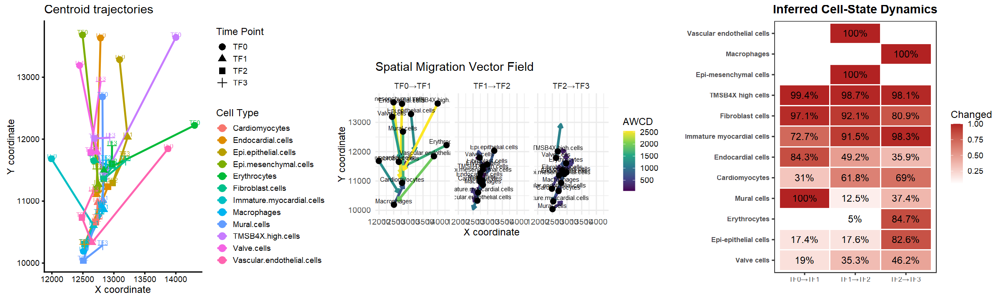

In [11]:
plot_all <- function(Centroids, AWCD, CellStateSummary, CellStateStats = NULL, sample_name, outdir = "./Final_outputs/", dpi = 600){
    if(!dir.exists(outdir))
        dir.create(outdir, recursive = TRUE)
    patient_dir <- file.path(outdir, sample_name)
    if (!dir.exists(patient_dir)) {dir.create(patient_dir, recursive = TRUE)}

    ## Plot centroid trajectories
    Centroids$Time <- factor(Centroids$Time, levels = unique(Centroids$Time))
    p1 <- ggplot(Centroids, aes(x = CentroidX, y = CentroidY, colour = CellType))+geom_path(aes(group = CellType),linewidth = 1) +
            geom_point(aes(shape = Time), size = 4) + geom_text(aes(label = Time), size = 3, nudge_y = 40, show.legend = FALSE) +
            coord_fixed() + theme_classic(base_size = 14) + labs(x = "X coordinate", y = "Y coordinate", colour = "Cell Type", shape = "Time Point") +
            labs(x = "X coordinate", y = "Y coordinate", title = "Centroid trajectories")
    ggsave(file.path(patient_dir, "CentTraj.png"), p1, width = 14, height = 10, dpi = dpi)
    
    ## Spatial Migration Vector Field
    tp <- unique(Centroids$Time)
    Vectors <- list()
    k <- 1
    for(ct in unique(Centroids$CellType)){
        tmp <- Centroids %>% filter(CellType == ct)
        if(nrow(tmp) < 2)
            next
        tmp <- tmp[match(tp,tmp$Time),]
        for(i in 1:(nrow(tmp)-1)){
            if(any(is.na(tmp$CentroidX[c(i,i+1)])))
                next
            dx <- tmp$CentroidX[i+1]-tmp$CentroidX[i]
            dy <- tmp$CentroidY[i+1]-tmp$CentroidY[i]
            dist <- sqrt(dx^2+dy^2)
            
            Vectors[[k]] <- data.frame(CellType = ct, Interval = paste(tmp$Time[i], tmp$Time[i+1], sep="→"),
                                       x0 = tmp$CentroidX[i], y0 = tmp$CentroidY[i], x1 = tmp$CentroidX[i+1], y1 = tmp$CentroidY[i+1],
                                       Distance = dist, stringsAsFactors = FALSE)
            k <- k+1
        }
    }
    Vectors <- bind_rows(Vectors)
    p2 <- ggplot(Vectors, aes(x = x0, y = y0)) + geom_segment(aes(xend = x1, yend = y1, colour = Distance),
                                                             arrow = arrow(length = unit(0.22,"cm")), linewidth = 1.3) +
            geom_point(size = 3, colour = "black") + geom_text(aes(label = CellType), nudge_y = 120, size = 3) +
            facet_wrap(~Interval) + coord_equal() + scale_colour_viridis_c(option = "D", name = "AWCD") +
            theme_bw(base_size = 13) + theme(panel.grid = element_blank(), plot.title = element_text(face = "bold", hjust = 0.5), 
                                             legend.position = "right") + theme_minimal(base_size = 14) +
            labs(x = "X coordinate", y = "Y coordinate", title = "Spatial Migration Vector Field")
    ggsave(file.path(patient_dir, "MigVector.png"), p2, width = 14, height = 10, dpi = dpi)
    
    ## Inferred Cell-State Dynamics Heatmap
    DF <- CellStateSummary
    if(!is.null(CellStateStats)){
        DF <- DF %>% left_join(CellStateStats %>% select(CellType, FDR), by = c("BaselineCellType"="CellType"))                  ## Add FDR
        DF$Significance <- ifelse(is.na(DF$FDR),"", ifelse(DF$FDR < 0.001,"***", ifelse(DF$FDR < 0.01,"**", ifelse(DF$FDR < 0.05,"*",""))))
    }else{
        DF$Significance <- ""
    }
    p3 <- ggplot(DF, aes(x = Interval, y = reorder(BaselineCellType, ProportionChanged), fill = ProportionChanged))+
            geom_tile(colour = "white", linewidth = 0.6) + 
            geom_text(aes(label = paste0(round(100*ProportionChanged, 1), "%")), size = 5, vjust = 0.5, hjust = 0.5, position = position_nudge(x = 0, y = 0)) +       
            scale_fill_gradient(low = "white", high = "firebrick", name = "Changed") +
            theme_bw(base_size = 14) + labs(x = "", y = "", title = "Inferred Cell-State Dynamics") +
            theme(panel.grid = element_blank(), axis.text.y = element_text(size = 10, face="bold"), axis.text.x = element_text(size = 10),
                  plot.title = element_text(face = "bold", hjust = 0.5), legend.position = "right")    
    ggsave(file.path(patient_dir, "CellstateHeatmap.png"), p3, width = 14, height = 10, dpi = dpi, scale = 0.6)

    options(repr.plot.height = 6, repr.plot.width = 20)
    p_combined <- plot_grid(p1, p2, p3, ncol = 3)
    #ggsave(file.path(outdir, "All_plots_combined.png"), p_combined, width = 30, height = 8, dpi = dpi, scale = 1.4)
    print(p_combined)
}
plot_all(Centroids, AWCD, CellStateSummary, CellStateStats = NULL, sample_name = sample$sample_name, dpi = 600)

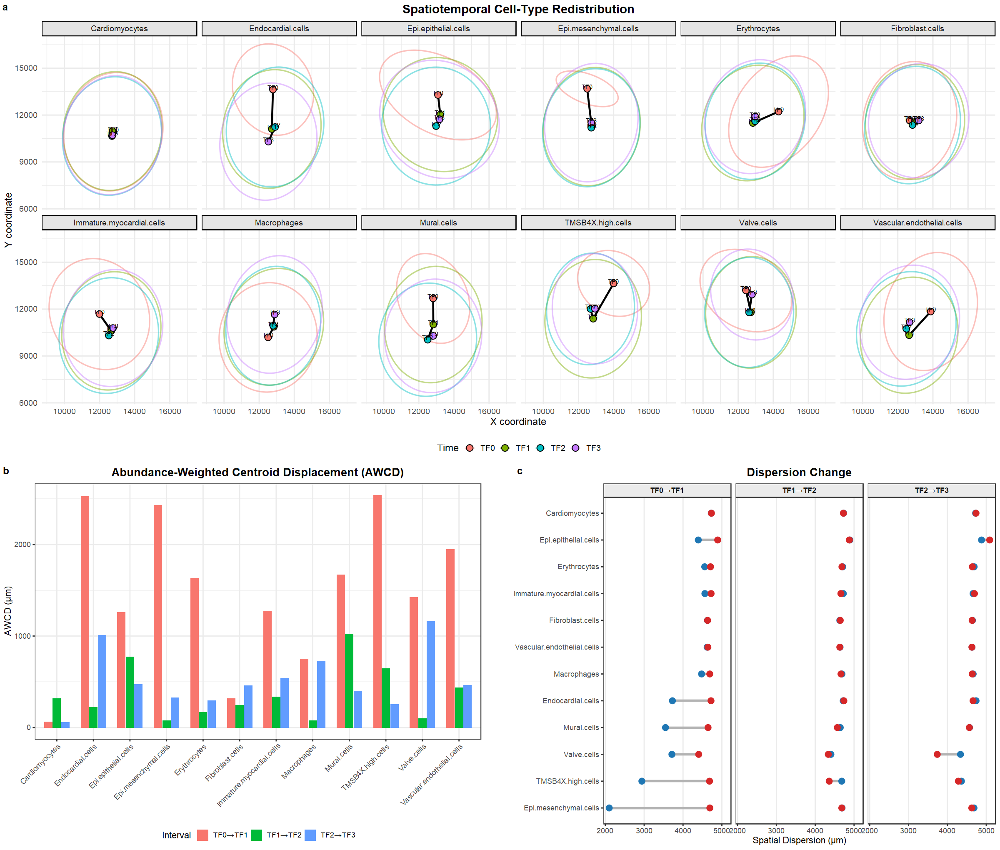

In [12]:
## Spatiotemporal Cell-Type Redistribution
plot_combined <- function(Centroids, AWCD, sample_name, outdir = "./Final_outputs/", width = 12, height = 10, dpi = 600){
    if(!dir.exists(outdir))
        dir.create(outdir, recursive = TRUE)
    patient_dir <- file.path(outdir, sample_name)
    if (!dir.exists(patient_dir)) {dir.create(patient_dir, recursive = TRUE)}

    ## ---------- Ellipse data ----------
    ellipse_df <- list()
    k <- 1
    for(i in seq_len(nrow(Centroids))){
        row <- Centroids[i,]
        theta <- seq(0, 2*pi, length.out = 150)

        a <- row$MajorAxis
        b <- row$MinorAxis

        phi <- row$Angle*pi/180

        xx <- a*cos(theta)
        yy <- b*sin(theta)

        xr <- xx*cos(phi)-yy*sin(phi)
        yr <- xx*sin(phi)+yy*cos(phi)

        ellipse_df[[k]] <- data.frame(x = xr + row$CentroidX, y = yr + row$CentroidY, CellType = row$CellType, Time = row$Time, stringsAsFactors = FALSE)
        k <- k+1
    }
    Ellipses <- bind_rows(ellipse_df)

    ## ---------- Trajectory ----------
    Centroids$Time <- factor(Centroids$Time, levels = unique(Centroids$Time))
    p_spatio <- ggplot() + geom_path(data = Ellipses, aes(x = x, y = y, colour = Time, group = interaction(CellType,Time)), linewidth = 0.7, alpha = 0.45) +
                    geom_path(data = Centroids, aes(x = CentroidX, y = CentroidY, group = CellType), 
                              arrow = arrow(length = unit(0.18,"cm")), linewidth = 1, colour = "black") +
                    geom_point(data = Centroids, aes(CentroidX, CentroidY, fill = Time), shape = 21, size = 3.8, colour = "black") +
                    geom_text(data = Centroids, aes(CentroidX, CentroidY, label = Time), size = 3, nudge_y = 120, show.legend = FALSE) +
                    facet_wrap(~CellType, nrow = 2) + theme_minimal(base_size = 14) +
                    labs(x = "X coordinate", y = "Y coordinate", fill = "Time", colour = "Time", title = "Spatiotemporal Cell-Type Redistribution") +
                    theme(strip.background = element_rect(fill="grey90"), legend.position = "bottom", 
                          plot.title = element_text(hjust = 0.5, face = "bold"))

    ## Panel A : AWCD
    p_awcd <- ggplot(AWCD$Table, aes(CellType, AWCD, fill = Interval)) + geom_col(position = position_dodge(0.7), width = 0.65) +
            theme_bw(base_size = 13) + labs(x = "", y = "AWCD (µm)", fill = "Interval", title = "Abundance-Weighted Centroid Displacement (AWCD)") +
            theme(axis.text.x = element_text(angle = 45, hjust = 1), legend.position = "bottom", plot.title = element_text(face = "bold", hjust = 0.5))

    ## Panel B : Dispersion
    DispersionDF <- AWCD$Table %>% select(CellType, Interval, Dispersion_T1, Dispersion_T2) #%>%
                                    #pivot_longer(cols = c(Dispersion_T1, Dispersion_T2), names_to = "Time", values_to = "Dispersion")
    p_disp <- ggplot(DispersionDF, aes(y = reorder(CellType, Dispersion_T1))) + 
                geom_segment(aes(x = Dispersion_T1, xend = Dispersion_T2, yend = CellType), colour = "grey70", linewidth = 1.2) +
                geom_point(aes(x = Dispersion_T1), colour = "#1F77B4", size = 3.5) +
                geom_point(aes(x = Dispersion_T2), colour = "#D62728", size = 3.5) + facet_wrap(~Interval, nrow = 1) +
                labs(x = "Spatial Dispersion (µm)", y = NULL, title = "Dispersion Change") + theme_bw(base_size = 13) +
                theme(panel.grid.major.y = element_blank(), panel.grid.minor = element_blank(), strip.background = element_rect(fill = "grey92"),
                      strip.text = element_text(face = "bold"), plot.title = element_text(face = "bold", hjust = 0.5), legend.position = "none")

    bottom_row <- plot_grid(p_awcd, NULL, p_disp, ncol = 3, rel_widths = c(1, 0.06, 1), labels = c("b", "", "c"), label_size = 14)

    options(repr.plot.height = 17, repr.plot.width = 20)
    final_plot <- plot_grid(p_spatio, bottom_row, ncol = 1, rel_heights = c(1.2, 1), labels = c("a", ""), label_size = 14)
    ggsave(file.path(patient_dir, "Spatiotemporal_AWCD_Dispersion.png"), final_plot, width = width, height = height, dpi = dpi)
    return(final_plot)
}
plot_combined(Centroids, AWCD, sample_name = sample$sample_name)